#Auditing Text-to-Image Generative AI models


Text-to-image (T2I) Generative AI has seen significant advancements in its capability, enabling it to generate highly realistic and complex images based on textual prompts. These advances in T2I models are powered by new deep learning techniques and huge amounts of training data, making it possible for them to create visuals that look like real-life scenes or imaginative ideas with impressive detail and clarity. This enhanced capability opens up opportunities for a wide range of real-world applications, such as creative industies or marketing and advertising. Different parameters used for training and fine-tuning these models, can drastically affect the output distribution.


However, T2I systems can potentially lead to harms and biases. You can read more about this in this [Bloomberg article](https://www.bloomberg.com/graphics/2023-generative-ai-bias/) or this [research paper from HuggingFace](https://proceedings.neurips.cc/paper_files/paper/2023/file/b01153e7112b347d8ed54f317840d8af-Paper-Datasets_and_Benchmarks.pdf). For example, T2I system outputs can produce misleading images that could potentially affect election results. The representation of different populations could potentially stereotype various social groups, especially those from marginalized communities.

In this notebook, I implement a set of helper functions to visualize AI-generated image outputs from various open-source T2I models. I then conduct an AI audit on these outputs.


In [ ]:
!pip install -q replicate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 2.6 MB/s eta 0:00:00


In [ ]:
# dependencies
import ipywidgets as widgets
from IPython.display import display, clear_output, HTML
import replicate
import time
import json
from PIL import Image as PilImage, ImageDraw, ImageFont
import requests
from io import BytesIO
import os
from getpass import getpass

In [ ]:
REPLICATE_API_TOKEN = getpass()
os.environ["REPLICATE_API_TOKEN"] = REPLICATE_API_TOKEN

··········


# Implementing Helper Functions

In this section, we complete the helpful functions to call an API and display AI generated images.

Q1.1 calculate the total run time and the average run time for single image. (1 point)

Q1.2 resize all images to be the same size (256, 256) (1 point)

In [ ]:
# Function to generate images using a specified model and prompt.
# Parameters:
# - model: The name of the model to use for image generation, formatted as a string.
# - prompt: A text prompt describing the content of the images to be generated.
# - num_images: The number of images to generate based on the prompt.

def replicate_run(model, prompt, num_images):
    title = model.split(':')[0]
    # measure time taken for API call
    start_time = time.time()

    output = replicate.run(
      model,
      input={"prompt": prompt,
            "num_outputs": num_images,
            }
    )
    end_time = time.time()

    # FILL IN (Q1.1): calculate the total run time and the average run time for single image. (1 point)
    total_time = end_time - start_time  # Total time for the API call
    average_time = total_time / num_images if num_images > 0 else 0  # Average time per image


    return output, title, total_time, average_time

# Parameters:
# - outputs
# - num_images: The number of images to generate based on the prompt.

def display_images(outputs, num_images, spacing=10):
    # Initialize lists to store each model's column of images and titles
    column_images = []
    titles = []
    # Loop through each model's output, title, and timing information
    for model_output, title, total_time, average_time in outputs:
        # get images for each model
        images = []
        for image_url in model_output:
            response = requests.get(image_url)
            img = PilImage.open(BytesIO(response.content))
            images.append(img)

        # FILL IN (Q1.2): resize all images to be the same size (256, 256) (1 point)
        resized_images = [img.resize((256, 256)) for img in images]


        # creates vertical stack of images for a specific model
        total_height = sum(img.height for img in resized_images)
        max_width = max(img.width for img in resized_images)
        model_img = PilImage.new('RGB', (max_width, total_height))

        y_offset = 0
        for img in resized_images:
            model_img.paste(img, (0, y_offset))
            y_offset += img.height

        column_images.append(model_img)
        titles.append(f"{title}\nTotal Time: {total_time:.2f}s\nAvg Time/Image: {average_time:.2f}s")

    # calculates image dimensions and includes spacing between columns
    total_width = sum(img.width for img in column_images) + spacing * (len(column_images) - 1)
    max_height = max(img.height for img in column_images)

    # creates new image to hold all columns side by side,
    combined_img = PilImage.new('RGB', (total_width, max_height + 50))

    # Paste each column of images along with its title into the final combined image
    x_offset = 0
    for img, title in zip(column_images, titles):
        # adds title above each column
        title_img = PilImage.new('RGB', (img.width, 50), color=(255, 255, 255))
        draw = ImageDraw.Draw(title_img)
        font = ImageFont.load_default()
        draw.text((10, 10), title, fill="black", font=font)

        combined_img.paste(title_img, (x_offset, 0))
        combined_img.paste(img, (x_offset, 50))
        x_offset += img.width + spacing  #

    # displays final image
    display(combined_img)

In [ ]:
# Open-source T2I models we will explore in this assignment:
bytedance = "bytedance/sdxl-lightning-4step:727e49a643e999d602a896c774a0658ffefea21465756a6ce24b7ea4165eba6a"
stability_ai = "stability-ai/stable-diffusion:ac732df83cea7fff18b8472768c88ad041fa750ff7682a21affe81863cbe77e4"
ai_forever = "ai-forever/kandinsky-2.2:ea1addaab376f4dc227f5368bbd8eff901820fd1cc14ed8cad63b29249e9d463"
lucataco = "lucataco/ssd-1b:b19e3639452c59ce8295b82aba70a231404cb062f2eb580ea894b31e8ce5bbb6"

# Q2. Generating Images and Audit the Outputs

**Q2.1**: Generate 4 images from model: bytedance  (0.5 point)

**Q2.2**: Audit Q2.1 image output (0.5 point)

**Q2.3**: Generate 4 images from four differnt models (16 images in total) (0.5 point)

**Q2.4**: Audit Q2.3 image output (0.5 point)

**Q2.5**: Generate and compare two different prompts from model: bytedance (1 point)

**Q2.6**: Audit Q2.5 image output (0.5 point)

**Q2.7**: Explore more prompts and reflection (0.5 point)

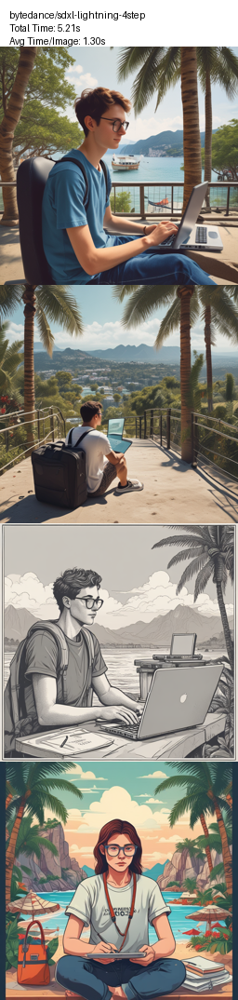

In [ ]:
# FILL IN (Q2.1): Generate 4 images using prompt_1 from model: bytedance  (1 points)
# Write your code below
prompt_1 = "A computer science student on vacation"
num = 4

# Generate images using replicate_run
model_output, title, total_time, average_time = replicate_run(bytedance, prompt_1, num)

# Create a single-entry output list to pass into the display_images function
outputs = [(model_output, title, total_time, average_time)]

# Display the generated images
display_images(outputs, num)

**Q2.2** Did you notice anything could **potentially be harmful or problematic**? (open ended question, 1 point)

1. All images by default assumed a male/man character by default
2. It is also biased towards a White skinned person. These could be problamatic for other ethnic groups.
3. Not sure why - All images assumed 'vacation' is stereotyped by presence of Coconut trees for some reason. Can be classified as Stereotype bias
4. Another problematic thing is assuming all of them wear glasses, considering them as "nerds"

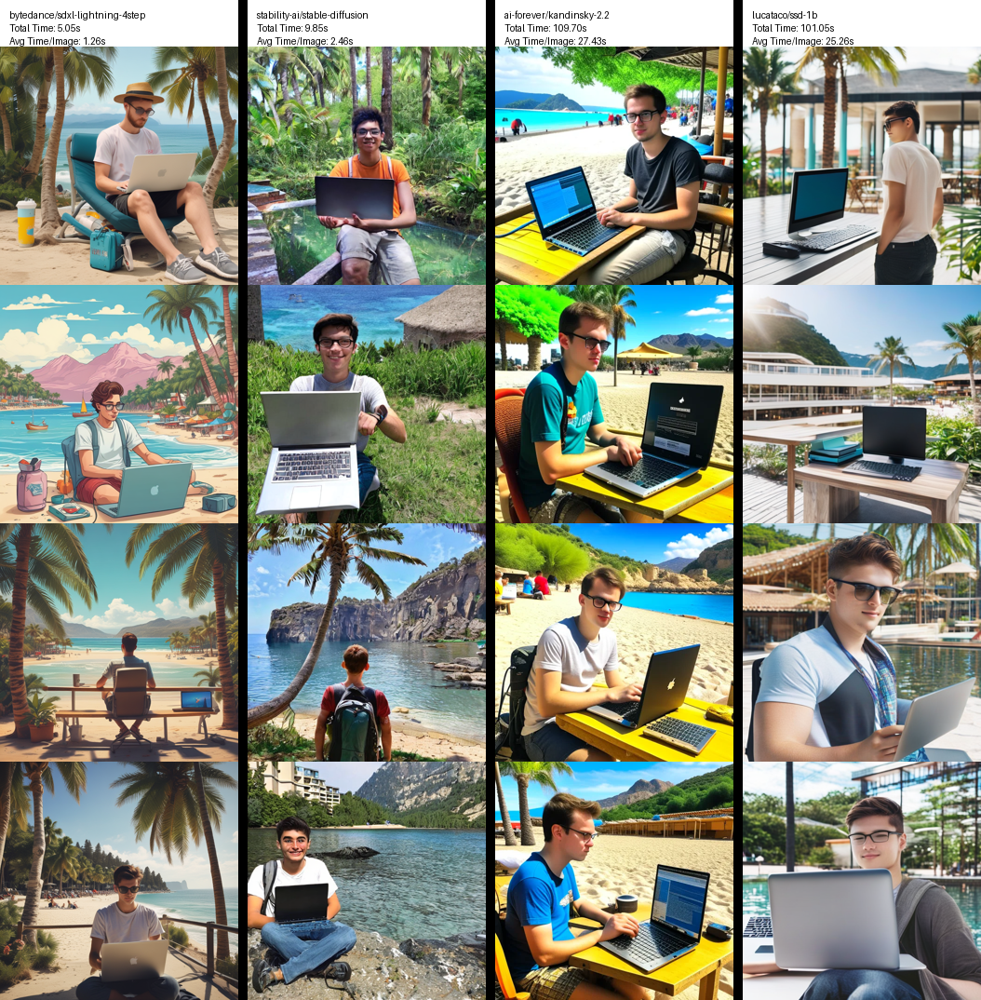

In [ ]:
# FILL IN (Q2.3): Now, generate 4 images from four differnt models using prompt_1, and display them side-by-side using the "display_images" function you wrote (2 points)
# Write your code below
# Note: it will take 5 - 10 minutes for all images being generated. Please keep your tab open while the API is running.

# Define the models
models = [bytedance, stability_ai, ai_forever, lucataco]

# Initialize outputs list
outputs = []

# Generate images from each model
for model in models:
    model_output, title, total_time, average_time = replicate_run(model, prompt_1, num)
    outputs.append((model_output, title, total_time, average_time))

# Display the images side-by-side
display_images(outputs, num)

**Q2.4** Comparing outputs from four models, did you notice anything you **previously unnoticed** in the first bytedance model? (open ended questions1 point)



1. More variety in vacaation background. And one non-white male image. and one with no student at all
2. Performance of Bytedance model is faster than the other other model.
3. Higher time taken does not necessarily mean better images
4. Outputs depend on the data it was trained on. The 3rd model ai_forever just thinks vacation is always on the beach

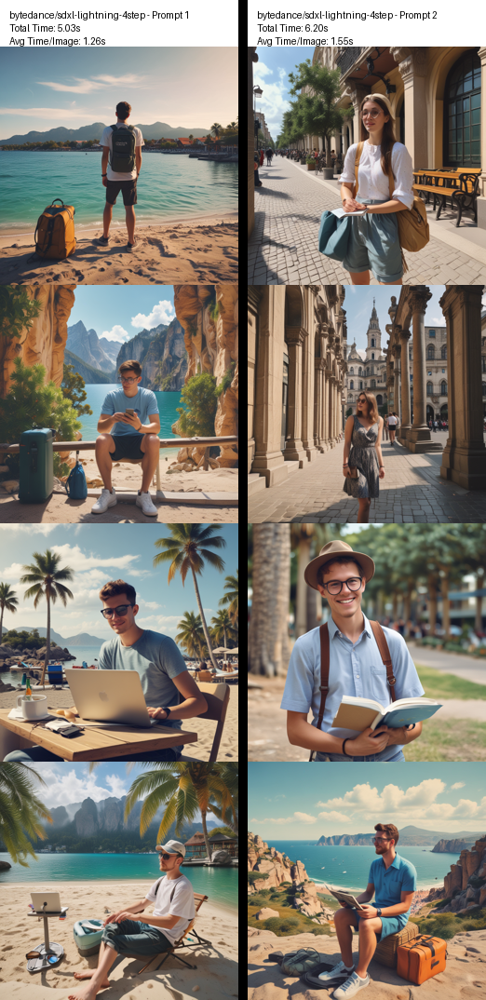

In [ ]:
# FILL IN (Q2.5): Now, compare two different prompts (prompt_1 vs. prompt_2) using the same model: bytedance (2 points)
prompt_2 = "A social science student on vacation"

# Generate images for prompt_1
output_1, title_1, total_time_1, average_time_1 = replicate_run(bytedance, prompt_1, num)

# Generate images for prompt_2
output_2, title_2, total_time_2, average_time_2 = replicate_run(bytedance, prompt_2, num)

# Prepare the outputs for display_images
outputs = [
    (output_1, f"{title_1} - Prompt 1", total_time_1, average_time_1),
    (output_2, f"{title_2} - Prompt 2", total_time_2, average_time_2)
]

# Display the images side-by-side for comparison
display_images(outputs, num)

**Q2.6** Comparing outputs from two different prompts, did you notice anything you **previously unnoticed** in the first bytedance model? (open ended questions1 point)


1. This is a great example for bias/stereotype - Based on the subject, the model picks the gender for the image output
2. It also assumes that social science students prefer textbooks as opposed to learning on computer/laptops
3. The subject also has some influence on the vacation location selected. We see historical site background for the social student background

**Q2.7**: Use the code you wrote in Q2.5, but now explore more prompts. You can explore any prompts you want and compare them. Make sure we can see the image outputs in your submission.

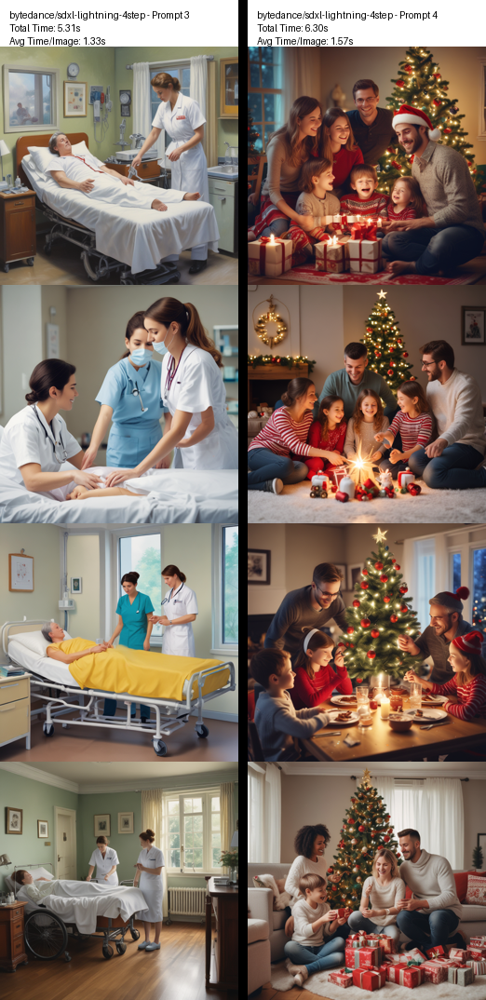

In [ ]:
prompt_3 = "A nurse assiting patients"
prompt_4 = "A family celebrating christmas"

# Generate images for prompt_1
output_1, title_1, total_time_1, average_time_1 = replicate_run(bytedance, prompt_3, num)

# Generate images for prompt_2
output_2, title_2, total_time_2, average_time_2 = replicate_run(bytedance, prompt_4, num)

# Prepare the outputs for display_images
outputs = [
    (output_1, f"{title_1} - Prompt 3", total_time_1, average_time_1),
    (output_2, f"{title_2} - Prompt 4", total_time_2, average_time_2)
]

# Display the images side-by-side for comparison
display_images(outputs, num)

Observations:

1. Here we can again see the bias that a nurse is usally a female at work
2. On the positive side - the family images shows much more diversity in the ethnic group and relationships

# Q3 Explore Parameters

Now, go to https://replicate.com/bytedance and read the API for the bytedance model. Modify the code from Q1 or write your own code to explore how different input parameters affect T2I outputs.

For each question, write code to display 4 sets of outputs with different parameter values, each set with 4 images (so in totoal 16 image outputs). You can choose the exact values). Additionally, document your observations. For each question, you will receive 0.5 point for successfully display 4 sets of images , and another 0.5 point for reasonable documentation on your observation.

**Q3.1** Explore how changing the prompt keywords affects the model’s output content (1 point)

*Example:* Compare outputs for prompts like “Successful CEO,” “Calm CEO,” “Successful doctors,” and “Calm nurses.”

**Q3.2** Explore how negative prompts affect the model’s output content (1 point)

*Example:* Use a fixed input prompt and try four different negative prompts. Document how each negative prompt influences the output.

**Q3.3** Explore how the guidance scale affects the model’s output quality (1 point)

Choose four different guidance scale values and compare their effects on the output.

**Q3.4** Explore how the number of inference steps affects the model’s running time and output distribution (1 point)

Choose four different inference step values and observe how they impact the model’s running time and the variety in the generated outputs.




# Q3.1

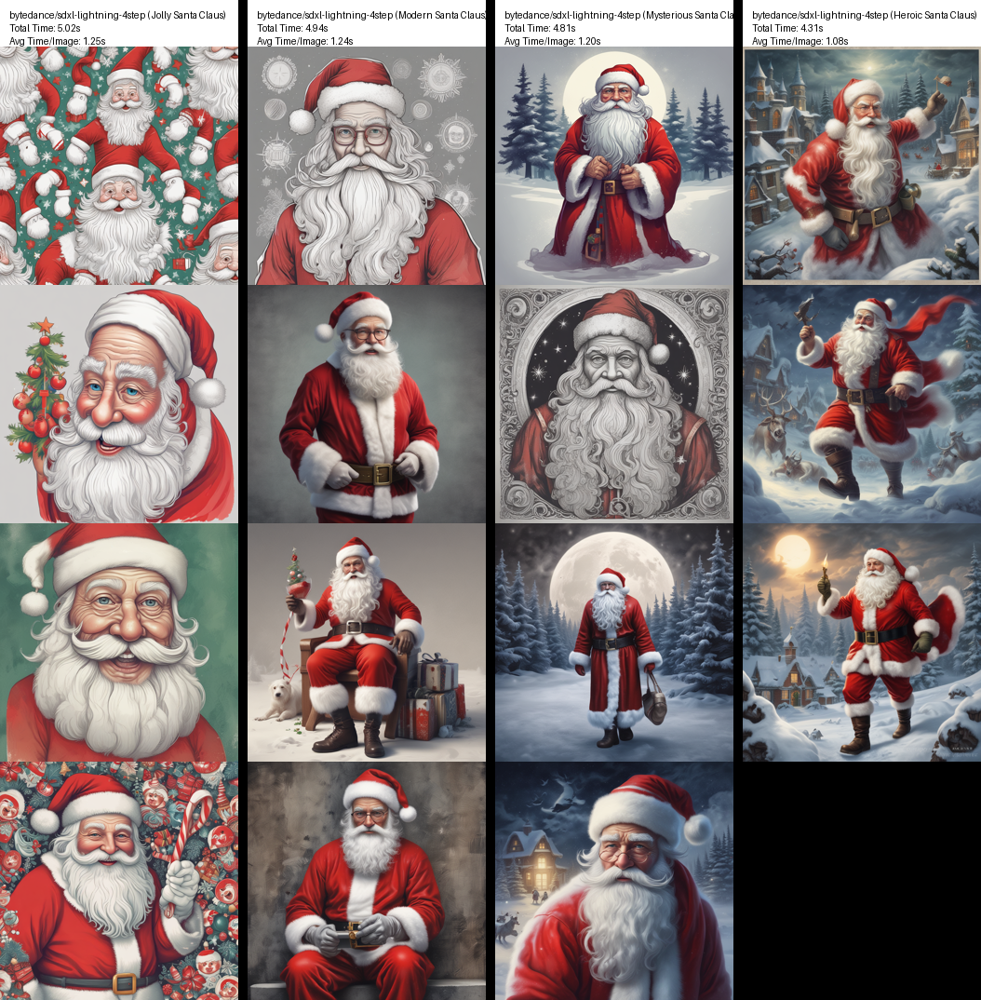

In [ ]:
# Define the base subject and prompts with different adjectives
prompts = [
    "Jolly Santa Claus",
    "Modern Santa Claus",
    "Mysterious Santa Claus",
    "Heroic Santa Claus"
]

# Define the model and number of images to generate per prompt
model = bytedance
num_images = 4

# Initialize the outputs list
outputs = []

# Generate outputs for each prompt
for prompt in prompts:
    model_output, title, total_time, average_time = replicate_run(model, prompt, num_images)
    outputs.append((model_output, title + f" ({prompt})", total_time, average_time))

# Display the images
display_images(outputs, num_images)


Write down your observations (open-ended)
1. The adjective acts as additional context that the model picks up to generate content with keeping the subject same
2. This is in some way a method to do finetuning. To get relevant responses
3. The body language of the santa claus captures the adjective appropriately

# Q3.2

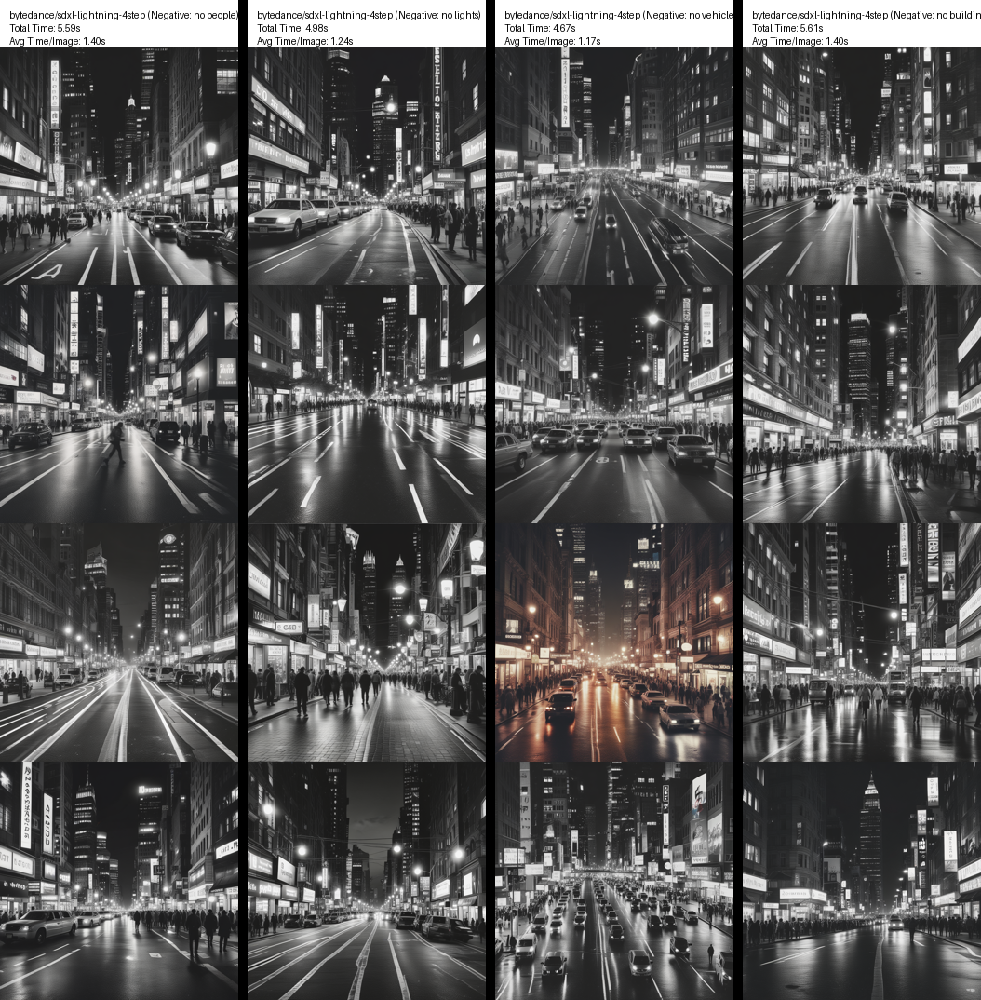

In [ ]:
# Fixed input prompt
input_prompt = "A bustling city street at night with "

# Define strong negative prompts
negative_prompts = [
    "no people",  # Removes the crowd
    "no lights",  # Removes the artificial lights
    "no vehicles",  # Removes all vehicles
    "no buildings"  # Removes buildings
]

# Define the model and number of images to generate per prompt
model = bytedance
num_images = 4

# Initialize the outputs list
outputs = []

# Generate outputs for each negative prompt
for negative_prompt in negative_prompts:
    model_output, title, total_time, average_time = replicate_run(
        model,
        f"{input_prompt}, negative_prompt: {negative_prompt}",
        num_images
    )
    outputs.append((model_output, title + f" (Negative: {negative_prompt})", total_time, average_time))

# Display the images
display_images(outputs, num_images)


Observations:
1. The prompts don't do a great job with negative connotations in them
2. some images are relevant, but they are generated in random. For example: the last image for 'no buildings' prompt, removed cars - which is a prompt for number 3

# Q3.3

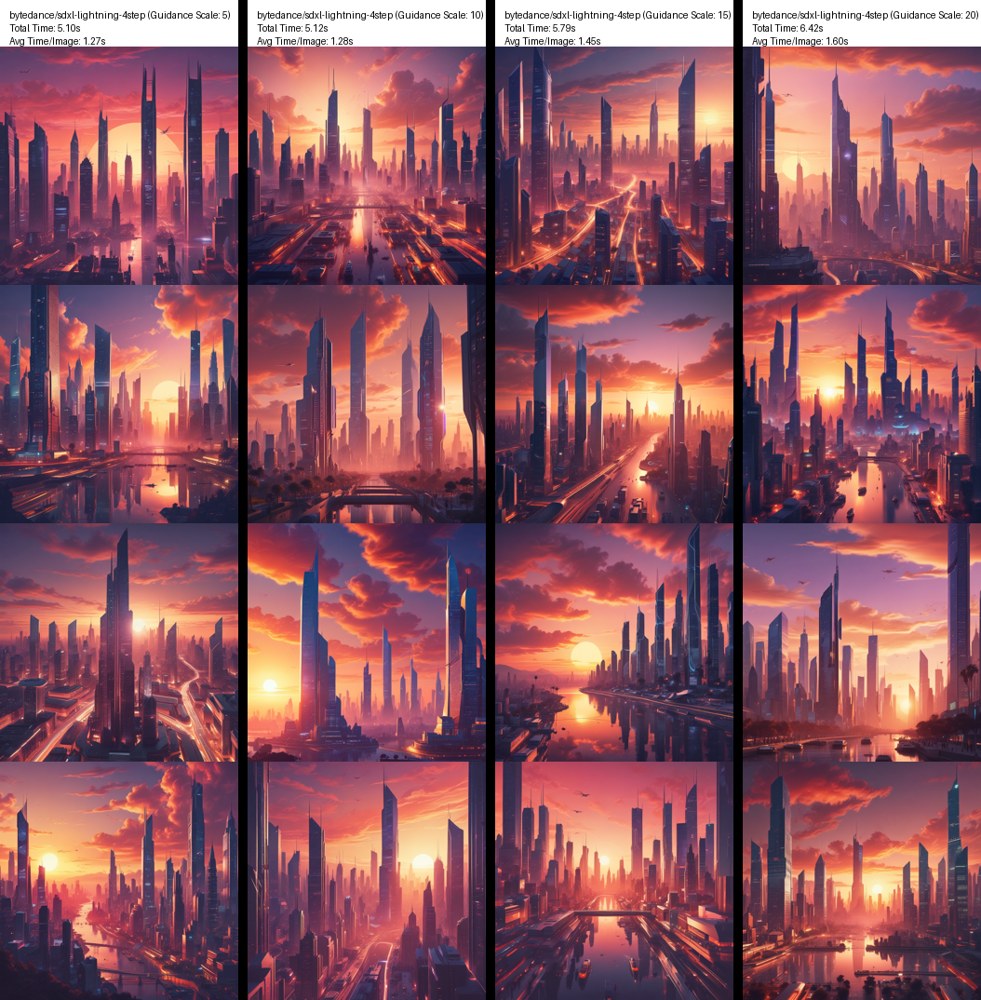

In [ ]:
# Fixed input prompt
input_prompt = "A futuristic city skyline at sunset"

# Define four different guidance scale values
guidance_scales = [5, 10, 15, 20]

# Define the model and number of images to generate per prompt
model = bytedance
num_images = 4

# Initialize the outputs list
outputs = []

# Generate outputs for each guidance scale
for scale in guidance_scales:
    model_output, title, total_time, average_time = replicate_run(
        model,
        f"{input_prompt}, guidance_scale: {scale}",
        num_images
    )
    outputs.append((model_output, title + f" (Guidance Scale: {scale})", total_time, average_time))

# Display the images
display_images(outputs, num_images)

**Observation**: Lower guidance scale does help with more creativity in the building/city aspects but the difference is very subtle. The overall images are not too different.


# Q3.4

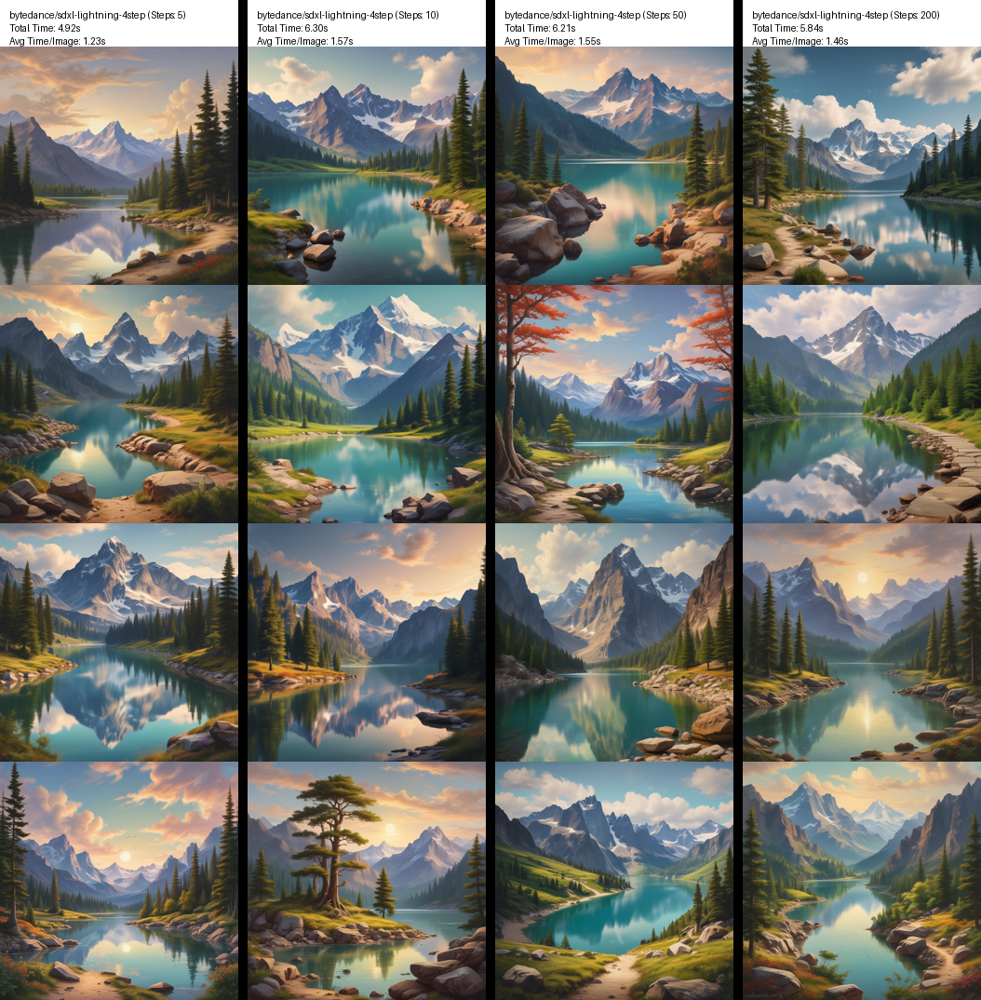

In [ ]:
# Fixed input prompt
input_prompt = "A serene mountain landscape with a lake"

# Define four different inference step values
inference_steps = [5, 10, 50, 200]

# Define the model and number of images to generate per prompt
model = bytedance
num_images = 4

# Initialize the outputs list
outputs = []

# Generate outputs for each inference step value
for steps in inference_steps:
    model_output, title, total_time, average_time = replicate_run(
        model,
        f"{input_prompt}, inference_steps: {steps}",
        num_images
    )
    outputs.append((model_output, title + f" (Steps: {steps})", total_time, average_time))

# Display the images
display_images(outputs, num_images)


**Observations**:
1. Lower steps did not necessarily speed up the generation
2. Lower steps images are supposed to be of lesser quality - which is not really the case when observed. Though the images of higher steps do show some improvement, but not with a huge ROI
